In [1]:
import sys, os, time
# %load_ext autoreload
# %autoreload 2
os.environ['FOUNDATION_RUN_MODE'] = 'jupyter'
os.environ['FOUNDATION_SAVE_DIR'] = '/is/ei/fleeb/workspace/chome/trained_nets'
os.environ['FOUNDATION_DATA_DIR'] = '/is/ei/fleeb/workspace/local_data'
# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"
from IPython import display
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as distrib
import torch.multiprocessing as mp
import torchvision.models
import torchvision
from torch.utils.data import Dataset, DataLoader, TensorDataset
import gym
import numpy as np
%matplotlib notebook
# %matplotlib tk
import matplotlib.pyplot as plt
import imageio
import seaborn as sns
#plt.switch_backend('Qt5Agg') #('Qt5Agg')
import foundation as fd
from foundation import models
from foundation import util
from foundation import train
#from foundation.util import replicate, Cloner

from hybrid import get_model, get_data

np.set_printoptions(linewidth=120, suppress=True)

In [2]:
media_root = '/is/ei/fleeb/workspace/media/hybrid/new/3dshapes'
# util.create_dir(media_root)
root = os.environ['FOUNDATION_SAVE_DIR']
names = [n for n in os.listdir(root) if 'fd' in n and not 'test' in n]
for i, name in enumerate(names):
    print(i,name)

0 fdwae1e-3_191204-214746
1 fdvae1e-4-warm4_191204-214746
2 fdvae1e-4-warm10_191204-214751
3 fdwae1e-4-probp5_191204-214751
4 fdwae1e-4-priorp2-warm10_191204-214852
5 fdvae1e-4-priorp2-warm4_191204-214756
6 fdvae1e-4_191204-214750
7 fdwae1e-5-priorp2_191204-214850
8 fdwae1e-4-warm4_191204-214754
9 fdwae1e-3-priorp2_191204-214750
10 fdwae1e-4-warm10_191204-215122
11 fdwae1e-5_191204-214744
12 fdwae1e-4-priorp2_191204-214754
13 fdvae1e-4-priorp2-warm10_191204-214746
14 fdwae1e-4-priorp2-warm4_191204-214744
15 fdwae1e-4_191204-214841
16 fdwae1e-4-probp5-priorp2_191204-214751
17 fdvae1e-4-priorp2_191204-214749


In [3]:
idx = 16

# idx = None

if idx is not None: # load existing model args
    name = names[idx]
    path = os.path.join(root, name)
    A = None
    print('Using: {}'.format(name))
else: # create new model args
    path = None
    A = train.get_config('model')
    print('Using: blank')

Using: fdwae1e-4-probp5-priorp2_191204-214751


In [4]:
A, (dataset, *other), model, ckpt = train.load(path=path, A=A, get_model=get_model, get_data=get_data, return_ckpt=True)
print(model)
print(model.optim)

/is/ei/fleeb/workspace/foundation/foundation/train/config.py:58: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f)


Loaded /is/ei/fleeb/workspace/chome/trained_nets/fdwae1e-4-probp5-priorp2_191204-214751/best.pth.tar
Set dataroot to: /is/ei/fleeb/workspace/local_data
Dataset 3dshapes moved to cuda
Dataset din=(3, 64, 64), dout=(3, 64, 64)
Model-type: factor-dropin
prob: 0.5
prob_max: None
prob_max default: None
latent_disc: None
latent_disc default: None
reg_prior: 0.2
ldisc_steps: 1
ldisc_steps default: 1
ldisc_gp: 10.0
ldisc_gp default: 10.0
Creating sub-component: encoder (type=conv)
din: (3, 64, 64)
in_shape is an alias for din
in_shape default: (3, 64, 64)
channels: [32, 32, 64, 64, 128]
latent_dim: 16
feature_dim: None
feature_dim default: None
nonlin: prelu
output_nonlin: None
output_nonlin default: None
downsampling: max
norm_type: instance
output_norm_type: None
output_norm_type default: None
fc: [256, 128]
hidden_fc is an alias for fc
hidden_fc default: [256, 128]
kernels: 3
strides: 2
factors: 1
optim_type: adam
lr: 0.001
weight_decay: 0
momentum: 0
beta1: 0.9
beta2: 0.999
Creating sub-co

In [5]:
records = ckpt['records']
'Trained on {:2.2f} M samples'.format(records['total_samples']['train']/1e6)

'Trained on 41.90 M samples'

In [6]:
A.dataset.batch_size = 16
loader = train.get_loaders(dataset, batch_size=A.dataset.batch_size, num_workers=A.num_workers,
                            shuffle=True, drop_last=False, )
loader = iter(loader)

Using batched data loader


In [7]:
batch = next(loader)
# batch = next(loader)
batch = util.to(batch, A.device)

In [261]:
save_dir = os.path.join(media_root, name)
reverse_rows = False
grdlines = False
save_figs = True
if save_figs:
    util.create_dir(save_dir)

In [262]:
def show_nums(imgs, titles=None, H=None, W=None, figsize=(6,6)):
    if H is None and W is None:
        B = imgs.size(0)
        l = int(np.sqrt(B))
        assert l**2 == B, 'not right: {} {}'.format(l, B)
        H, W = l, l
    elif H is None:
        H = imgs.shape[0] // W
    elif W is None:
        W = imgs.shape[0] // H
    
    imgs = imgs.cpu().permute(0,2,3,1).squeeze().numpy()
    
    fig, axes = plt.subplots(H, W, figsize=figsize)
    
    if titles is None:
        titles = [None]*len(imgs)
    
    iH, iW = imgs.shape[1], imgs.shape[2]
    
    for ax, img, title in zip(axes.flat, imgs, titles):
        plt.sca(ax)
        if reverse_rows:
            img = img[::-1]
        plt.imshow(img)
        if grdlines:
            plt.plot([0,iW],[iH/2,iH/2],c='r',lw=.5,ls='--')
            plt.plot([iW/2,iW/2],[0,iH],c='r',lw=.5,ls='--')
            plt.xlim(0,iW)
            plt.ylim(0,iH)
        if title is not None:
            plt.xticks([])
            plt.yticks([])
            plt.title(title)
        else:
            plt.axis('off')
#     fig.tight_layout()
    return fig

In [8]:
model.scheduler.get_lr()

[8.000000000000001e-06, 8.000000000000001e-06, 4.000000000000001e-05]

In [9]:
model.scheduler.step_size, model.scheduler.gamma

(30, 0.2)

In [10]:
[p['lr'] for p in model.optim.param_groups]

[0.001, 0.001, 0.005]

In [11]:
model.optim.enc.param_groups[0]['lr']

0.001

In [12]:
model.scheduler.last_epoch

97

In [13]:
print(model.optim)
model.schedule_step()
print(model.optim)

Complex-Optimizer(
  enc: Adam (
    Parameter Group 0
        amsgrad: False
        betas: (0.9, 0.999)
        eps: 1e-08
        initial_lr: 0.001
        lr: 0.001
        weight_decay: 0
    )
  gen: Adam (
    Parameter Group 0
        amsgrad: False
        betas: (0.9, 0.999)
        eps: 1e-08
        initial_lr: 0.001
        lr: 0.001
        weight_decay: 0
    )
  disc: Adam (
    Parameter Group 0
        amsgrad: False
        betas: (0.5, 0.9)
        eps: 1e-08
        initial_lr: 0.005
        lr: 0.005
        weight_decay: 0
    )
)
LR Scheduler stepping
Complex-Optimizer(
  enc: Adam (
    Parameter Group 0
        amsgrad: False
        betas: (0.9, 0.999)
        eps: 1e-08
        initial_lr: 0.001
        lr: 8.000000000000001e-06
        weight_decay: 0
    )
  gen: Adam (
    Parameter Group 0
        amsgrad: False
        betas: (0.9, 0.999)
        eps: 1e-08
        initial_lr: 0.001
        lr: 8.000000000000001e-06
        weight_decay: 0
    )
  disc:

In [263]:
# # args.dataset = '3dshapes'
# args.dataset = 'dsprites'

# datasets = get_data(args)

In [264]:
plt.close('all')

In [265]:
X, = batch
X.shape#, Y.shape

torch.Size([16, 3, 64, 64])

<IPython.core.display.Javascript object>


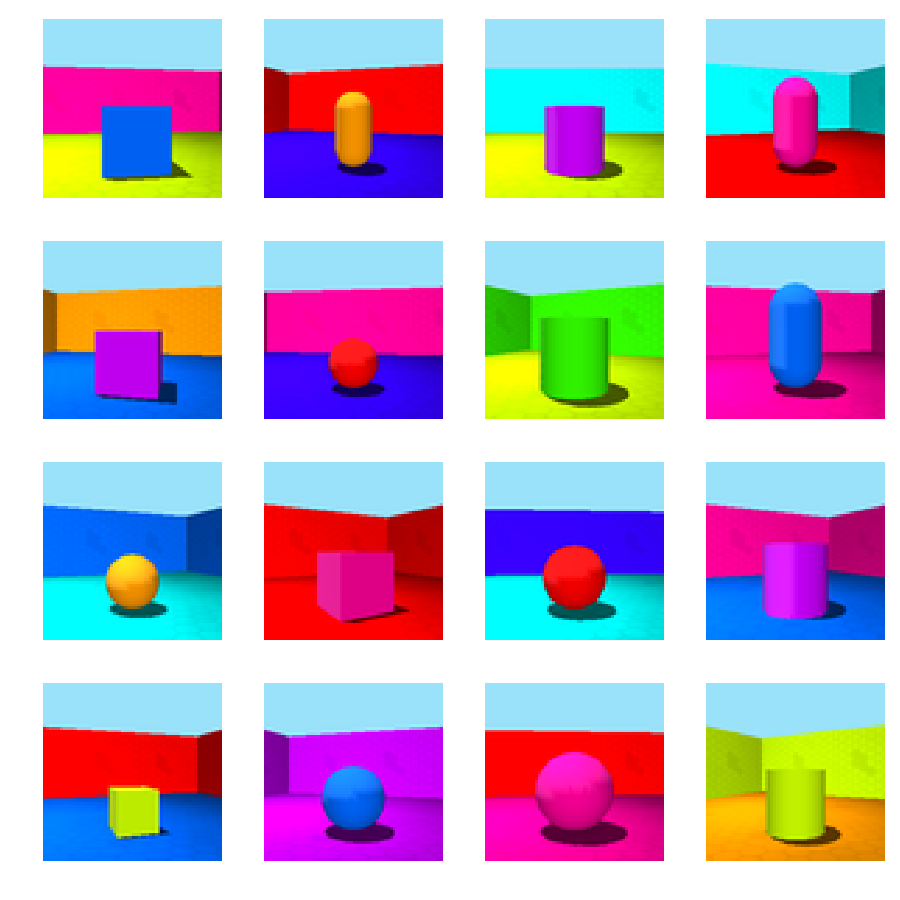

In [266]:
fig = show_nums(X, figsize=(9,9), H=4)
# fig.suptitle("originals", fontsize=14)
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'originals.png'))

<IPython.core.display.Javascript object>


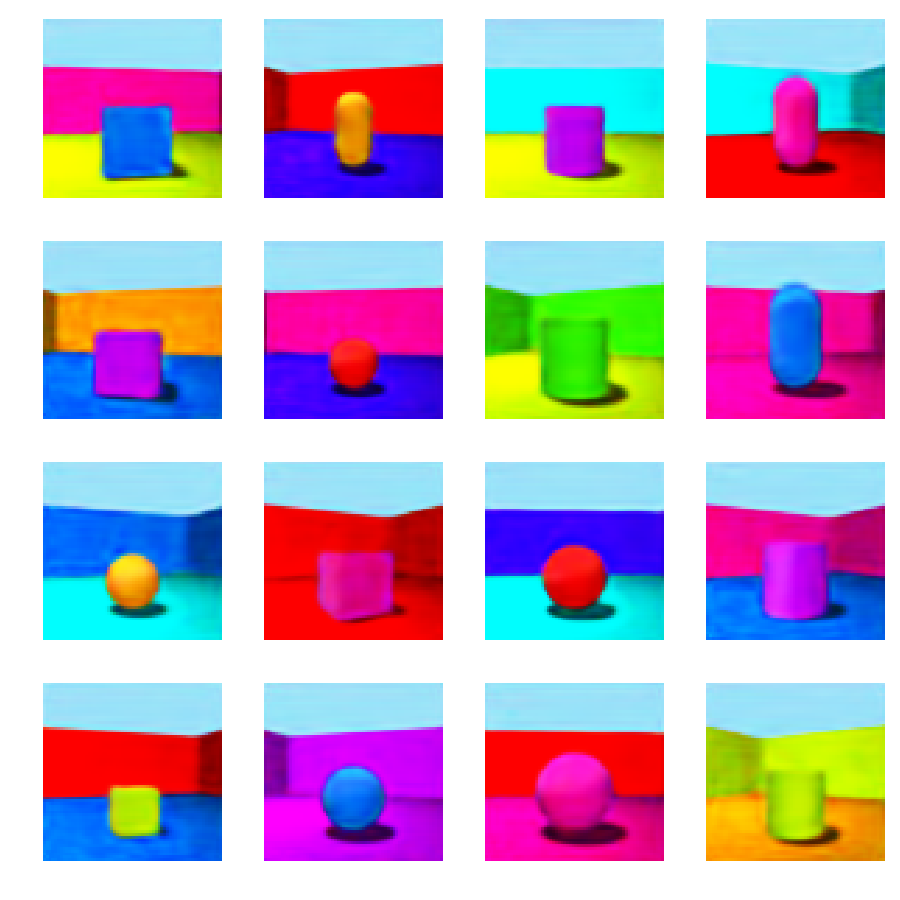

In [267]:
with torch.no_grad():
    
    if model.enc is None:
        q = model.sample_prior(X.size(0))
    else:
        q = model.encode(X)
    qdis = q
    qmle = q
    if isinstance(q, distrib.Distribution):
        q = q.rsample()
        qmle = qdis.loc
    rec = model.decode(q)
    vrec = model.disc(rec) if model.disc is not None else None
fig = show_nums(rec,figsize=(9,9),  W=4)#['{:4.0f}'.format(v.item()) for v in vrec])
# fig.suptitle("reconstructions" if model.enc is not None else 'generated', fontsize=14)
plt.tight_layout()
rec.shape#, q.shape
if save_figs:
    plt.savefig(os.path.join(save_dir,'recs.png' if model.enc is not None else 'gen.png'))

In [268]:
stats = qmle.min(0)[0], qmle.max(0)[0], qmle.mean(0), qmle.std(0)
stat_names = ['min', 'max', 'mean', 'std']
stats

(tensor([-1.9244, -2.4143, -1.3856, -1.4976, -0.3916, -1.2558, -0.2132, -2.0422,
         -1.5989, -0.8221, -2.8110, -1.4262, -2.4444, -3.2663, -1.4083, -0.8377],
        device='cuda:0'),
 tensor([1.4819, 1.9099, 1.1944, 1.4497, 0.4435, 1.4535, 0.1771, 2.1989, 1.1822,
         0.8938, 1.5316, 1.9760, 2.3235, 1.1632, 1.8349, 0.8800],
        device='cuda:0'),
 tensor([-0.1059, -0.1180, -0.0810,  0.2759,  0.0052,  0.1522, -0.0257,  0.0438,
         -0.4129,  0.0546, -0.2596,  0.2667,  0.2788, -0.3352,  0.5623, -0.0203],
        device='cuda:0'),
 tensor([1.1795, 1.1506, 1.0777, 0.9661, 0.2651, 0.7396, 0.1391, 1.1892, 0.9863,
         0.4538, 1.1054, 1.1404, 1.4587, 1.1176, 1.1661, 0.6097],
        device='cuda:0'))

<IPython.core.display.Javascript object>


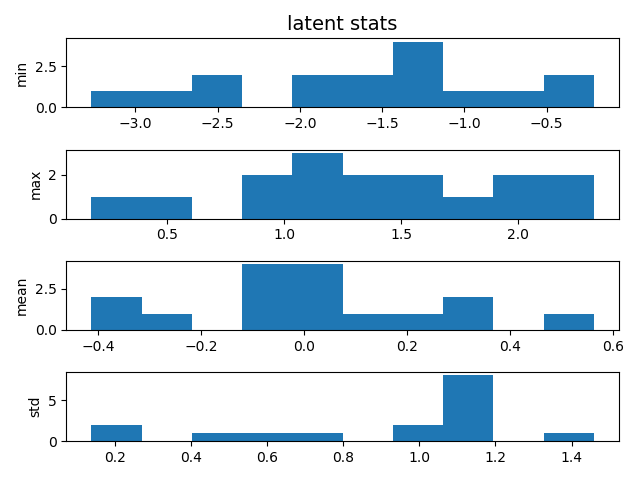

In [269]:
fig, axs = plt.subplots(4)
plt.sca(axs[0])
plt.title("latent stats", fontsize=14)
for ax, stat, sname in zip(axs, stats, stat_names):
    plt.sca(ax)
    plt.ylabel(sname)
    plt.hist(stat.cpu().numpy())
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'stats.png'))
pass

In [270]:
# if isinstance(qdis, distrib.Distribution):
#     mu, sigma = qdis.loc, qdis.scale
#     stats = sigma.min(0)[0], sigma.max(0)[0], sigma.mean(0), sigma.std(0)
    
#     fig, axs = plt.subplots(4)
#     for ax, stat, sname in zip(axs, stats, stat_names):
#         plt.sca(ax)
#         plt.ylabel(sname)
#         plt.hist(stat.cpu().numpy())
#     fig.suptitle("scales", fontsize=14)
#     plt.tight_layout()

<IPython.core.display.Javascript object>


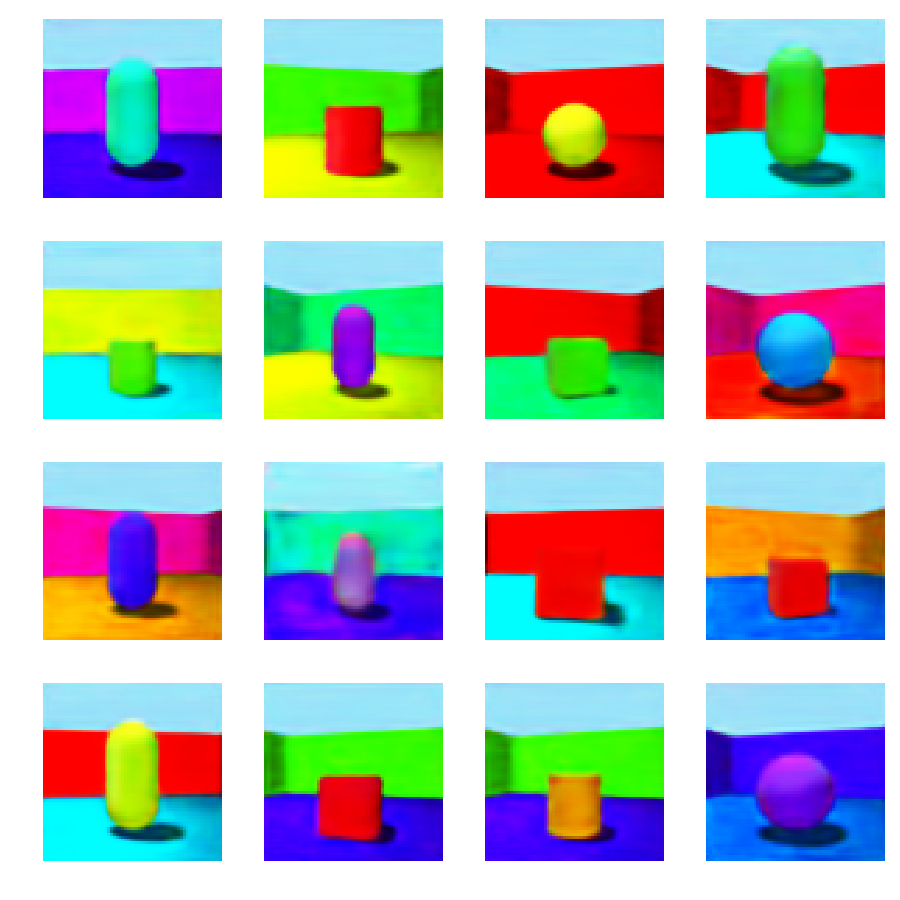

(torch.Size([16, 16]), torch.Size([16, 3, 64, 64]))

In [271]:
with torch.no_grad():
    mix = util.shuffle_dim(q)
#     try:
#         hyb = model.hybridize(qdis)
#     except NotImplementedError:
#         model.splits = model.latent_dim
#         hyb = Hybrid_Generator.hybridize(model, qdis)
    hygen = model.decode(mix)
    vhyb = model.disc(hygen) if model.disc is not None else None
fig = show_nums(hygen,figsize=(9,9))#, ['{:4.0f}'.format(v.item()) for v in vhyb])
# fig.suptitle("hybrid", fontsize=14)
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'hybrids.png'))
mix.shape, hygen.shape

<IPython.core.display.Javascript object>


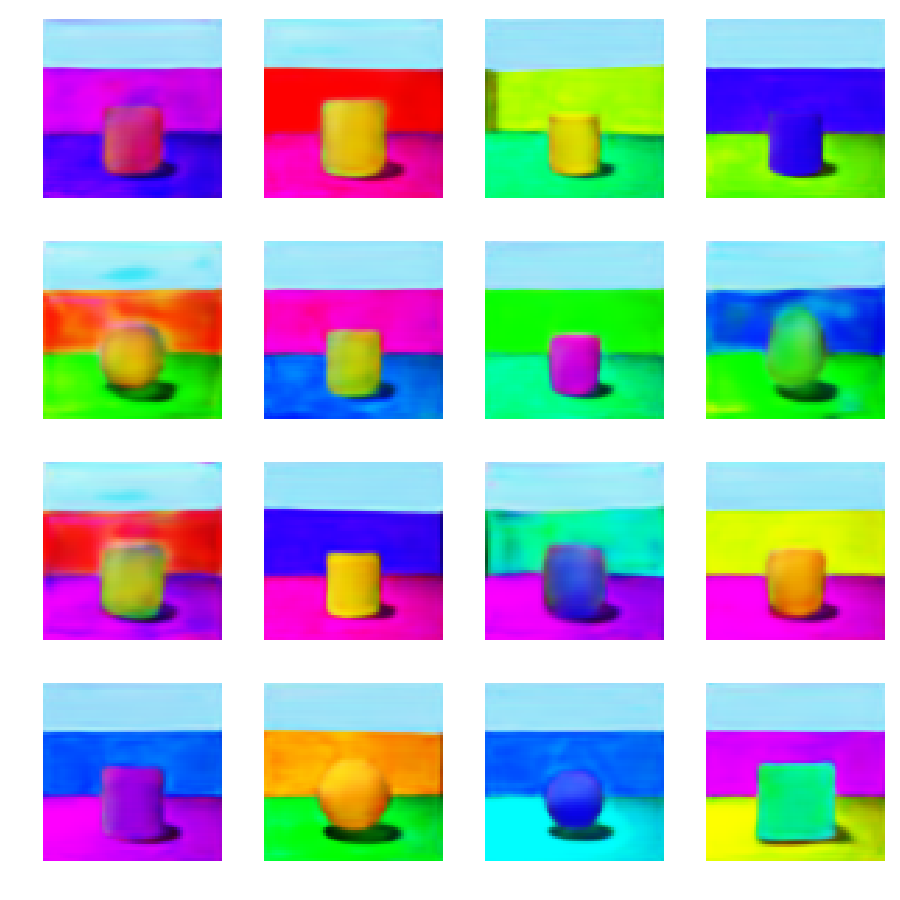

In [272]:
with torch.no_grad():
    gen = model.generate(X.size(0))
fig = show_nums(gen,figsize=(9,9),  )#['{:4.0f}'.format(v.item()) for v in vrec])
# fig.suptitle("generated", fontsize=14)
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'gen.png'))
pass

In [273]:
# plt.close('all')

In [274]:
# # dim = 3
# idx = 1

# plt.figure()
# plt.imshow(rec[idx,0].cpu().numpy())
# plt.axis('off')
# pass

In [275]:
latent_dim = A.model.latent_dim
latent_dim

16

In [276]:
q.shape

torch.Size([16, 16])

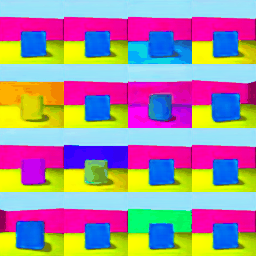

In [277]:

rows = 4
steps = 60
bounds = -2,2
# bounds = None
dlayout = rows, latent_dim//rows
outs = []

all_diffs = []
inds = [0, 2, 3]
inds = np.arange(len(q))
save_inds = [0, 1, 2, 3]

for idx in inds:

    walks = []
    for dim in range(latent_dim):

        dev = q[:,dim].std()
        if bounds is None:
            deltas = torch.linspace(q[:,dim].min(), q[:,dim].max(), steps)
        else:
            deltas = torch.linspace(bounds[0],bounds[1], steps)
        vecs = torch.stack([q[idx]]*steps)
        vecs[:,dim] = deltas

        with torch.no_grad():
            walks.append(model.decode(vecs).cpu())

    walks = torch.stack(walks,1)
    chn = walks.shape[2]

    dsteps = 10
    diffs = (walks[dsteps:] - walks[:-dsteps]).abs()#.view(steps-dsteps, latent_dim, chn, 64*64)
#     diffs /= (walks[dsteps:]).abs()
    #diffs = diffs.clamp(min=1e-10,max=1).abs()
    diffs = diffs.view(steps-dsteps, latent_dim, chn* 64*64).mean(-1)
#     diffs = 1 - diffs.mean(-1)
#     print(diffs.shape)
#     diffs *= 2
    all_diffs.append(diffs.mean(0))
#     print(all_diffs[-1])

    if save_figs and idx in save_inds:
        
        walks_full = walks.view(steps, dlayout[0], dlayout[1], chn, 64, 64).permute(0,1,4,2,5,3).contiguous().view(steps,64*dlayout[0],64*dlayout[1],chn).squeeze()
        images = []
        for img in walks_full.cpu().numpy():
            images.append((img*255).astype(np.uint8))
        imageio.mimsave(os.path.join(save_dir, 'walks-idx{}.gif'.format(idx,dim)), images)

        with open(os.path.join(save_dir, 'walks-idx{}.gif'.format(idx,dim)),'rb') as f:
            outs.append(display.Image(data=f.read(), format='gif'))
        del walks_full
all_diffs = torch.stack(all_diffs)
outs[0]

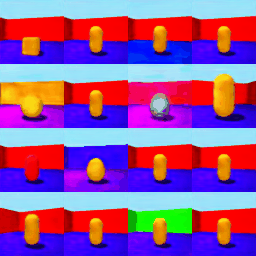

In [278]:
outs[1]

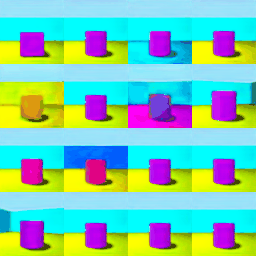

In [279]:
outs[2]

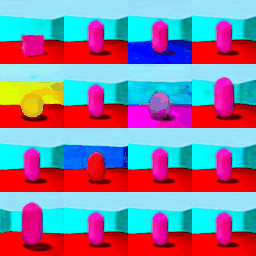

In [280]:
outs[3]

<IPython.core.display.Javascript object>


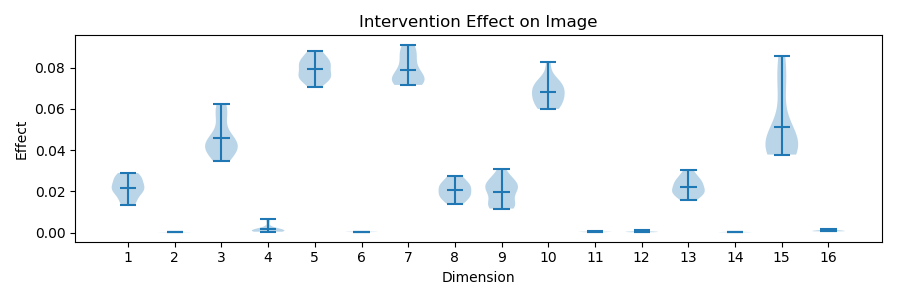

In [281]:
# violin plot of image effects
vals = all_diffs.cpu().numpy()
Xl = np.arange(vals.shape[-1])
fig, ax = plt.subplots(figsize=(9,3))
plt.violinplot(vals, Xl, points=200, widths=0.7,
                      showmeans=True, showextrema=True, showmedians=False)
plt.xticks(Xl, map(str, Xl+1))
plt.title('Intervention Effect on Image')
plt.xlabel('Dimension')
plt.ylabel('Effect')
plt.tight_layout()
if save_figs:
    plt.savefig(os.path.join(save_dir,'effect.png'))
pass